In [ ]:
# get the latest version from pypi 
# for other installations approaches, see https://dynamo-release.readthedocs.io/en/latest/ten_minutes_to_dynamo.html#how-to-install
# !pip install dynamo-release --upgrade --quiet

In [2]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))
%matplotlib inline

import dynamo as dyn
dyn.get_all_dependencies_version()

package,dynamo-release,pre-commit,cvxopt,trimap,numdifftools,colorcet,python-igraph,pynndescent,hdbscan,loompy,matplotlib,networkx,numba,numpy,pandas,scikit-learn,scipy,seaborn,setuptools,statsmodels,tqdm,umap-learn
version,1.0.0,2.11.1,1.2.6,1.4.3.dev1,0.9.39,2.0.6,0.9.0,0.5.2,0.8.27,3.0.6,3.4.1,2.5.1,0.53.1,1.20.3,1.2.3,0.23.2,1.6.1,0.11.1,54.2.0,0.12.2,4.58.0,0.5.1


In [3]:
# simulate ggplot2 plotting styple with black background

dyn.configuration.set_figure_params('dynamo', background='white')  

In [4]:
adata = dyn.sample_data.hgForebrainGlutamatergic()
adata.obs.Clusters = adata.obs.Clusters.astype('str') # set Clusters to strings 

|-----> Downloading data to ./data/hgForebrainGlut.loom
/home/xqiu/python37test-env/lib/python3.7/site-packages/numba/np/ufunc/parallel.py:365: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 9107. The TBB threading layer is disabled.
  warnings.warn(problem)


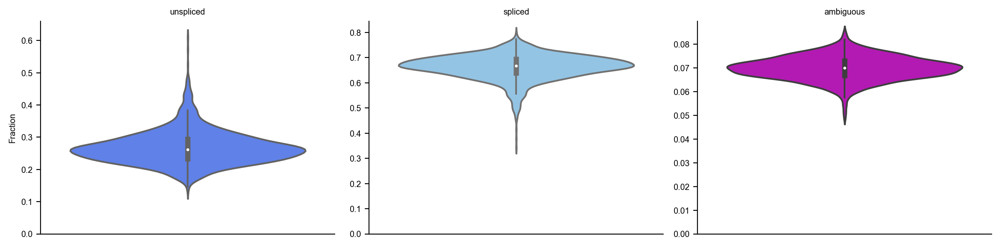

In [5]:
dyn.pl.show_fraction(adata)


In [6]:
dyn.pp.recipe_monocle(adata, n_top_genes=1000)


|-----> apply Monocole recipe to adata...
|-----> <insert> pp to uns in AnnData Object.
|-----------> <insert> has_splicing to uns['pp'] in AnnData Object.
|-----------> <insert> has_labling to uns['pp'] in AnnData Object.
|-----------> <insert> splicing_labeling to uns['pp'] in AnnData Object.
|-----------> <insert> has_protein to uns['pp'] in AnnData Object.
|-----> ensure all cell and variable names unique.
|-----> ensure all data in different layers in csr sparse matrix format.
|-----> ensure all labeling data properly collapased
|-----------> <insert> tkey to uns['pp'] in AnnData Object.
|-----------> <insert> experiment_type to uns['pp'] in AnnData Object.
|-----> filtering cells...
|-----> filtering genes...
|-----> calculating size factor...
|-----> selecting genes...
|-----> <insert> frac to var in AnnData Object.
|-----> size factor normalizing the data, followed by log1p transformation.
|-----> applying PCA ...
|-----> <insert> pca_fit to uns in AnnData Object.
|-----> <inse

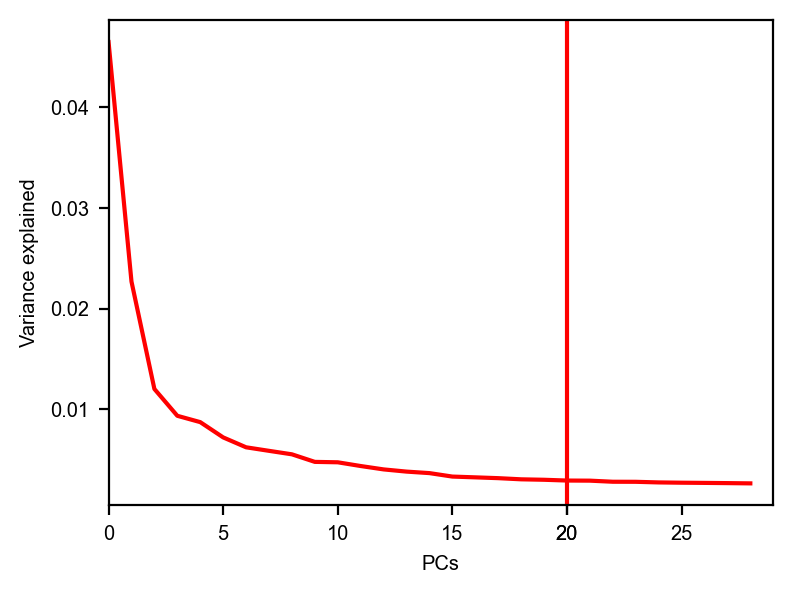

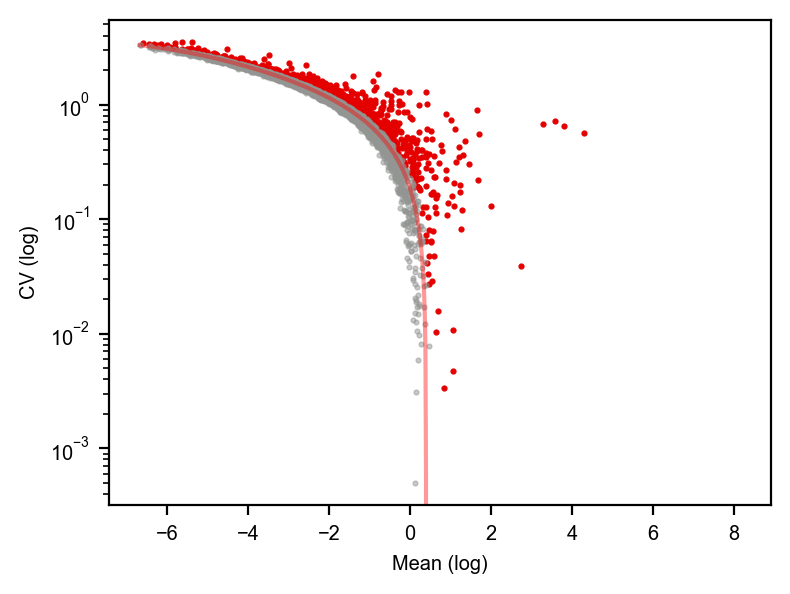

In [7]:
dyn.pl.variance_explained(adata)
dyn.pl.feature_genes(adata)

In [8]:
dyn.tl.dynamics(adata, model='deterministic') 
# or dyn.tl.dynamics(adata, model='stochastic')
# or dyn.tl.dynamics(adata, model='stochastic', est_method='negbin')


|-----> calculating first/second moments...
|-----> [moments calculation] in progress: 100.0000%
|-----> [moments calculation] finished [29.1692s]
/home/xqiu/python37test-env/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
estimating gamma: 100%|██████████| 1000/1000 [00:10<00:00, 93.24it/s]


AnnData object with n_obs × n_vars = 1720 × 32738
    obs: 'Clusters', 'nGenes', 'nCounts', 'pMito', 'use_for_pca', 'spliced_Size_Factor', 'initial_spliced_cell_size', 'unspliced_Size_Factor', 'initial_unspliced_cell_size', 'Size_Factor', 'initial_cell_size', 'ntr', 'cell_cycle_phase'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'cell_cycle_genes', 'nCells', 'nCounts', 'pass_basic_filter', 'score', 'log_cv', 'log_m', 'use_for_pca', 'frac', 'ntr', 'beta', 'gamma', 'half_life', 'alpha_b', 'alpha_r2', 'gamma_b', 'gamma_r2', 'gamma_logLL', 'delta_b', 'delta_r2', 'bs', 'bf', 'uu0', 'ul0', 'su0', 'sl0', 'U0', 'S0', 'total0', 'use_for_dynamics'
    uns: 'pp', 'velocyto_SVR', 'PCs', 'explained_variance_ratio_', 'pca_mean', 'pca_fit', 'feature_selection', 'cell_phase_genes', 'dynamics'
    obsm: 'X_pca', 'X', 'cell_cycle_scores'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced', 'X_spliced', 'X_unspliced', 'M_u', 'M_uu', 'M_s', 'M_us', 'M_ss', 'velocity_S'
    obsp: 'mo

In [9]:
dyn.tl.reduceDimension(adata)


|-----> retrive data for non-linear dimension reduction...
|-----> perform umap...
|-----> [dimension_reduction projection] in progress: 100.0000%
|-----> [dimension_reduction projection] finished [16.8736s]


In [10]:
dyn.tl.cell_velocities(adata)


|-----> [calculating transition matrix via pearson kernel with sqrt transform.] in progress: 100.0000%
|-----> [calculating transition matrix via pearson kernel with sqrt transform.] finished [4.6744s]
|-----> [projecting velocity vector to low dimensional embedding] in progress: 100.0000%
|-----> [projecting velocity vector to low dimensional embedding] finished [1.1364s]


AnnData object with n_obs × n_vars = 1720 × 32738
    obs: 'Clusters', 'nGenes', 'nCounts', 'pMito', 'use_for_pca', 'spliced_Size_Factor', 'initial_spliced_cell_size', 'unspliced_Size_Factor', 'initial_unspliced_cell_size', 'Size_Factor', 'initial_cell_size', 'ntr', 'cell_cycle_phase'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'cell_cycle_genes', 'nCells', 'nCounts', 'pass_basic_filter', 'score', 'log_cv', 'log_m', 'use_for_pca', 'frac', 'ntr', 'beta', 'gamma', 'half_life', 'alpha_b', 'alpha_r2', 'gamma_b', 'gamma_r2', 'gamma_logLL', 'delta_b', 'delta_r2', 'bs', 'bf', 'uu0', 'ul0', 'su0', 'sl0', 'U0', 'S0', 'total0', 'use_for_dynamics', 'use_for_transition'
    uns: 'pp', 'velocyto_SVR', 'PCs', 'explained_variance_ratio_', 'pca_mean', 'pca_fit', 'feature_selection', 'cell_phase_genes', 'dynamics', 'neighbors', 'umap_fit', 'grid_velocity_umap'
    obsm: 'X_pca', 'X', 'cell_cycle_scores', 'X_umap', 'velocity_umap'
    layers: 'matrix', 'ambiguous', 'spliced', 'unsplice

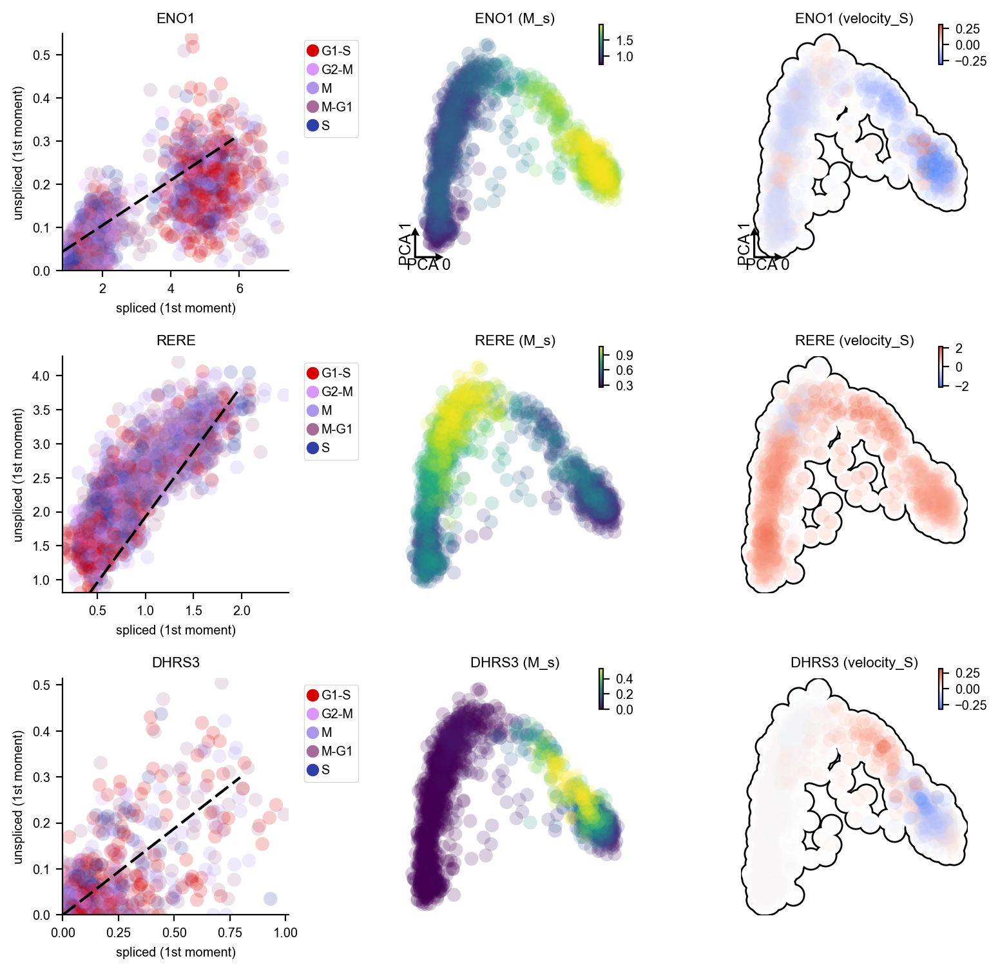

In [11]:
dyn.pl.phase_portraits(adata, genes=['RERE', 'ENO1', 'DHRS3'], ncols=3, figsize=(3, 3), basis='pca', show_quiver=False)

|-----> [projecting velocity vector to low dimensional embedding] in progress: 10.4651%

Using existing pearson_transition_matrix found in .obsp.


|-----> [projecting velocity vector to low dimensional embedding] in progress: 100.0000%
|-----> [projecting velocity vector to low dimensional embedding] finished [1.3442s]


<Figure size 600x400 with 0 Axes>

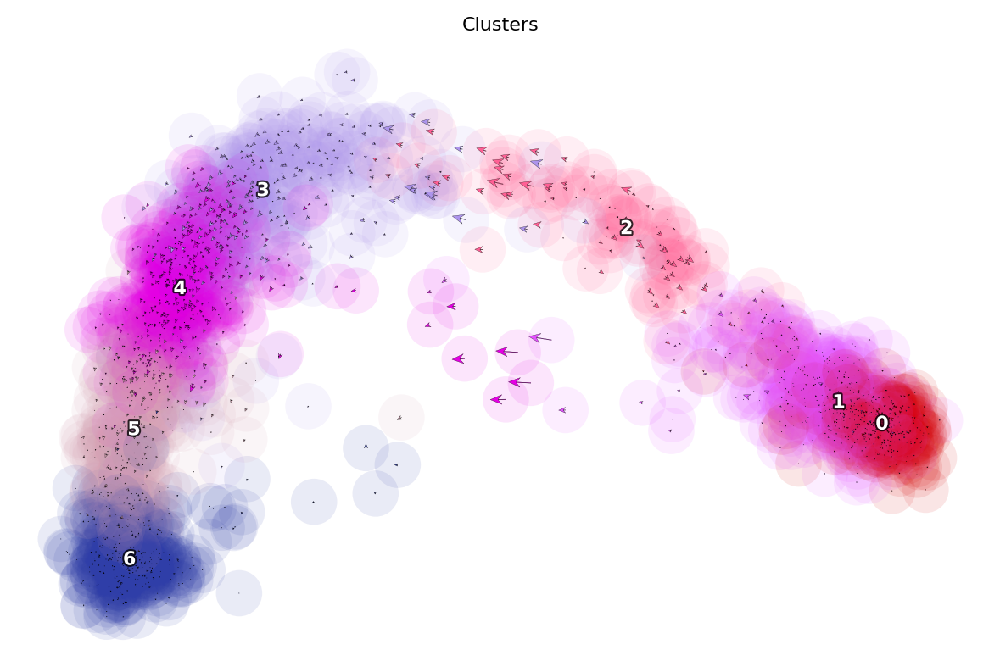

In [12]:
dyn.pl.cell_wise_vectors(adata, color=['Clusters'], basis='pca', quiver_size=2, quiver_length=1, show_legend='on data') # ['GRIA3', 'LINC00982', 'AFF2']


<Figure size 600x400 with 0 Axes>

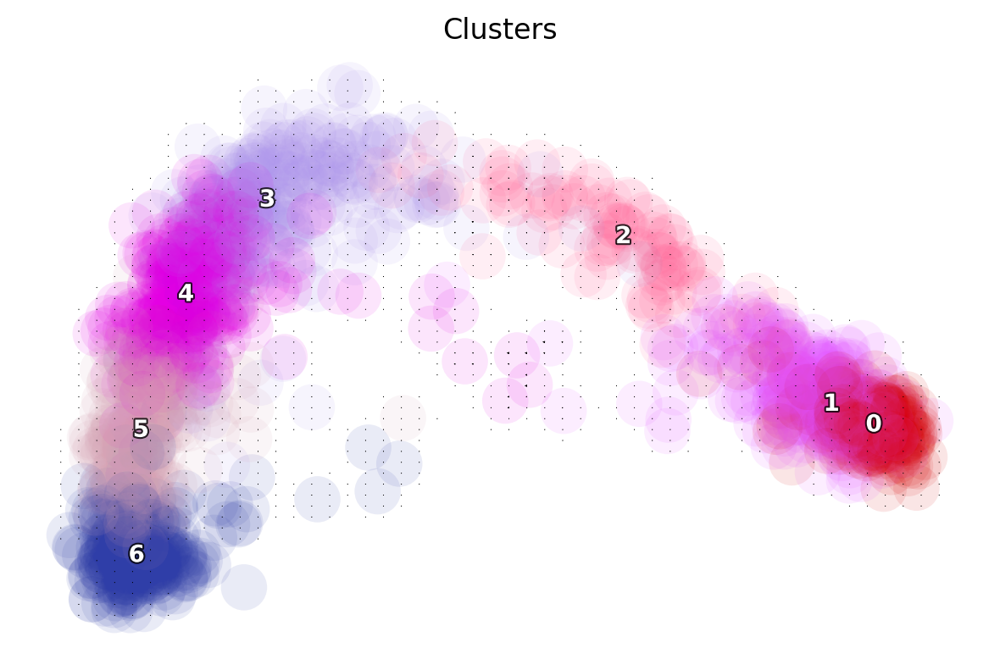

In [13]:
dyn.pl.grid_vectors(adata, color=['Clusters'], basis='pca')

<Figure size 600x400 with 0 Axes>

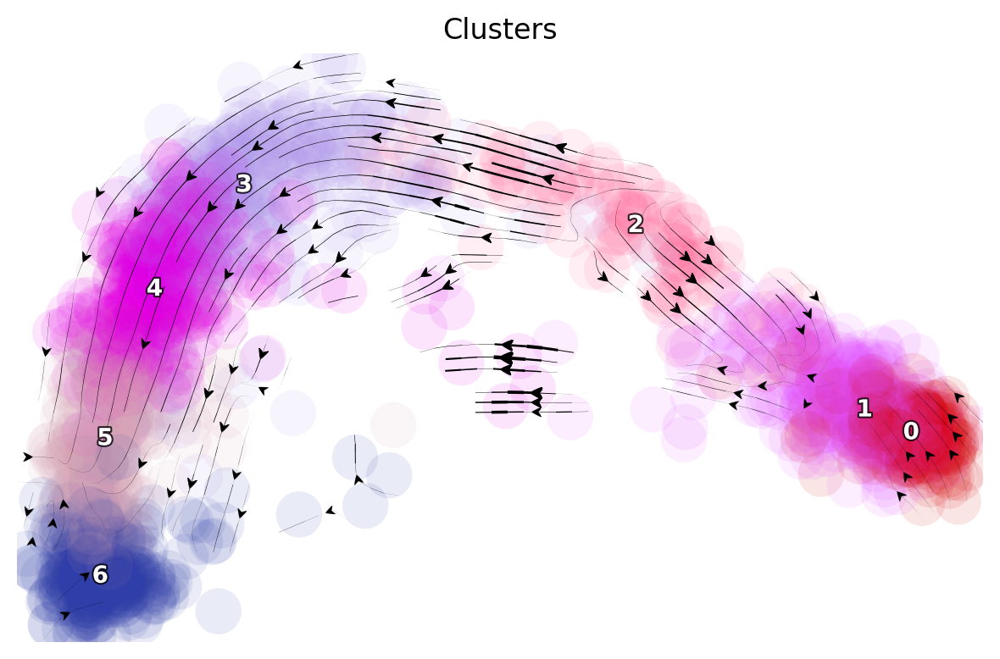

In [14]:

dyn.pl.streamline_plot(adata, color=['Clusters'], basis='pca') 

In [15]:
dyn.vf.VectorField(adata, basis='pca', dims=[0, 1])


|-----> vectorfield calculation begins...
|-----> Retrieve X and V based on basis: PCA. 
        Vector field will be learned in the PCA space.
|-----> Generating high dimensional grids and convert into a row matrix.
|-----> Learning vector field with method: sparsevfc.
|-----> [SparseVFC] begins...
|-----> Sampling control points based on data velocity magnitude...
|-----> [SparseVFC] in progress: 100.0000%
|-----> [SparseVFC] finished [1.0292s]
|-----> <insert> velocity_pca_SparseVFC to obsm in AnnData Object.
|-----> <insert> X_pca_SparseVFC to obsm in AnnData Object.
|-----> <insert> VecFld_pca to uns in AnnData Object.
|-----> <insert> control_point_pca to obs in AnnData Object.
|-----> <insert> inlier_prob_pca to obs in AnnData Object.
|-----> <insert> obs_vf_angle_pca to obs in AnnData Object.
|-----> [VectorField] in progress: 100.0000%
|-----> [VectorField] finished [1.1138s]


|-----> Vector field for umap is not constructed. Constructing it and mapping its topography now ...
|-----> vectorfield calculation begins...
|-----> Retrieve X and V based on basis: UMAP. 
        Vector field will be learned in the UMAP space.
|-----> Generating high dimensional grids and convert into a row matrix.
|-----> Learning vector field with method: sparsevfc.
|-----> [SparseVFC] begins...
|-----> Sampling control points based on data velocity magnitude...
|-----> [SparseVFC] in progress: 100.0000%
|-----> [SparseVFC] finished [0.5515s]
|-----> <insert> velocity_umap_SparseVFC to obsm in AnnData Object.
|-----> <insert> X_umap_SparseVFC to obsm in AnnData Object.
|-----> <insert> VecFld_umap to uns in AnnData Object.
|-----> Mapping topography...
|-----> <insert> control_point_umap to obs in AnnData Object.
|-----> <insert> inlier_prob_umap to obs in AnnData Object.
|-----> <insert> obs_vf_angle_umap to obs in AnnData Object.
|-----> [VectorField] in progress: 100.0000%
|---

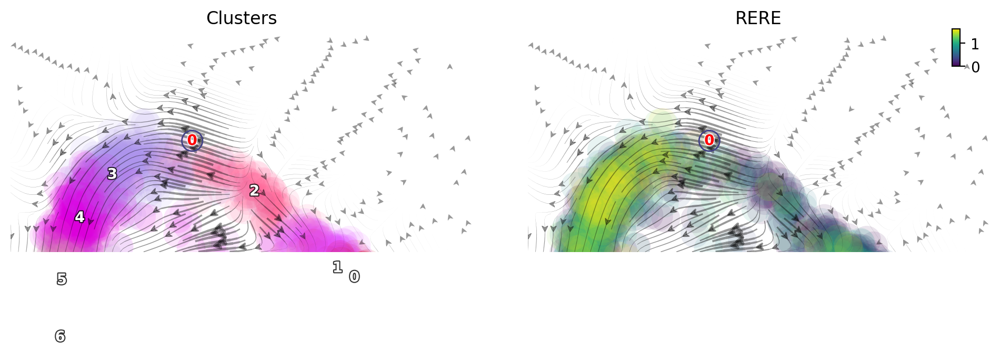

In [16]:
dyn.pl.topography(adata, color=['Clusters', 'RERE'], basis='pca', ncols=2)

In [17]:
dyn.configuration.set_figure_params('dynamo', background='white')  

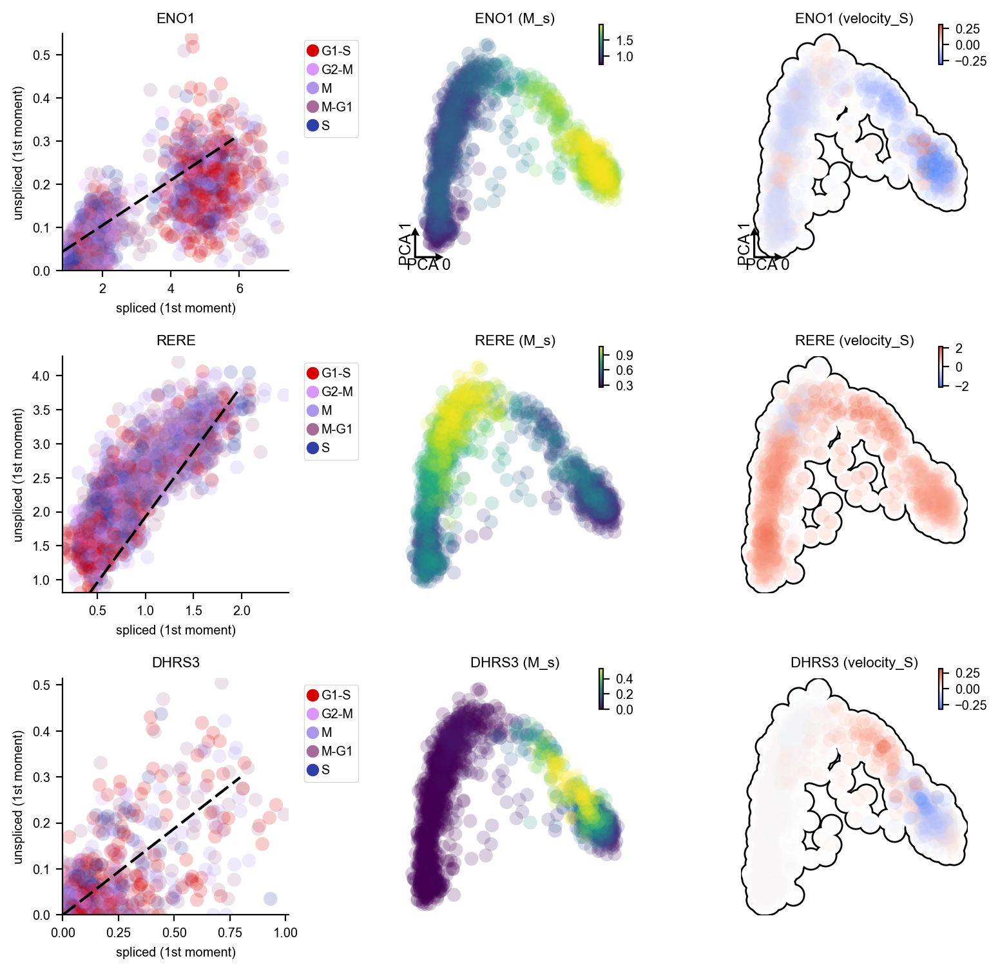

<Figure size 600x400 with 0 Axes>

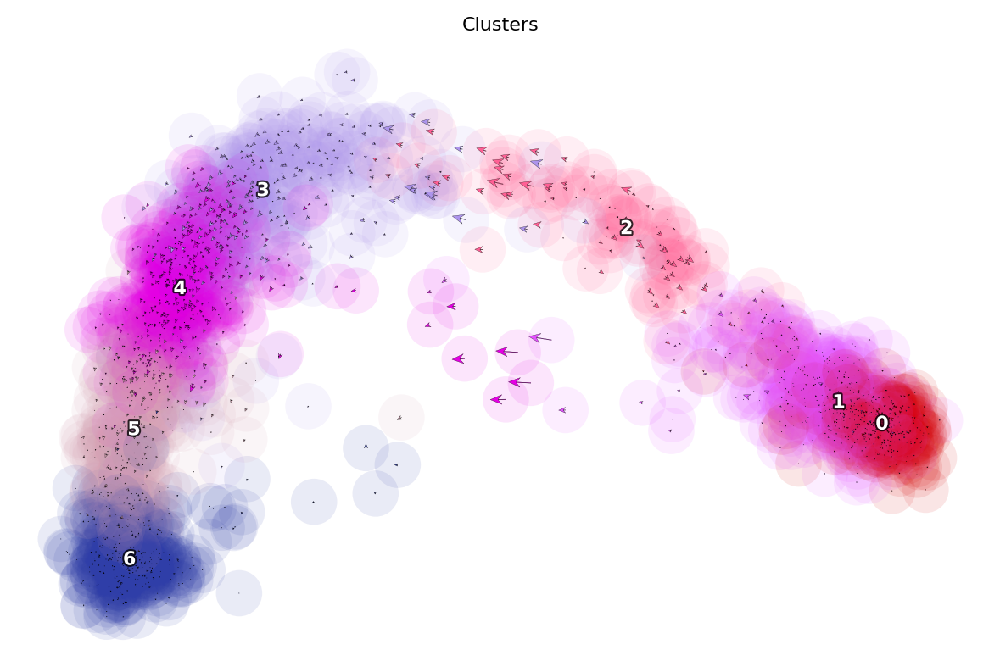

<Figure size 600x400 with 0 Axes>

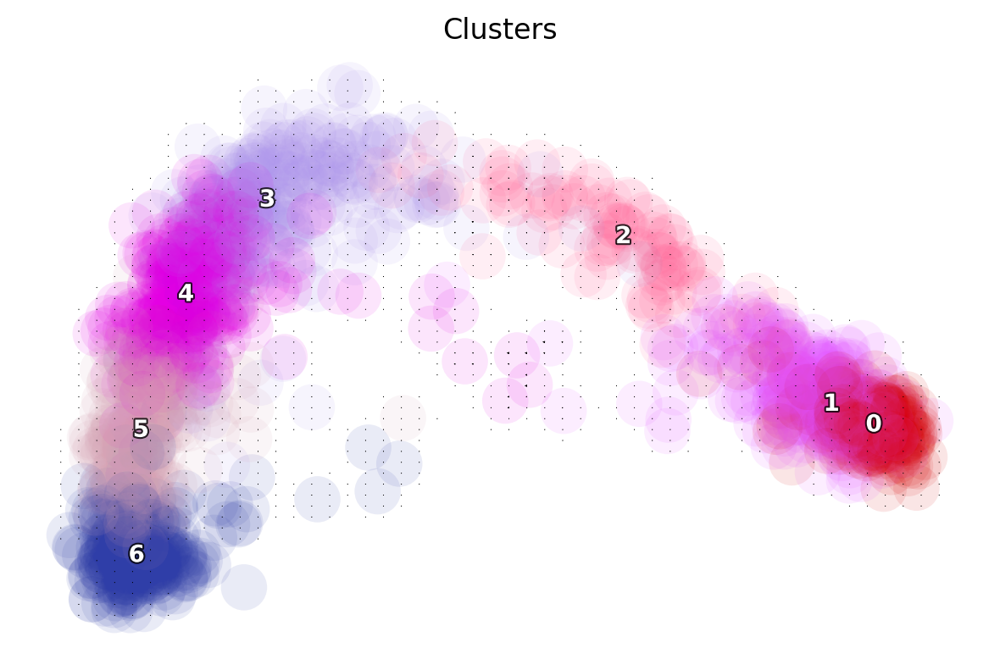

<Figure size 600x400 with 0 Axes>

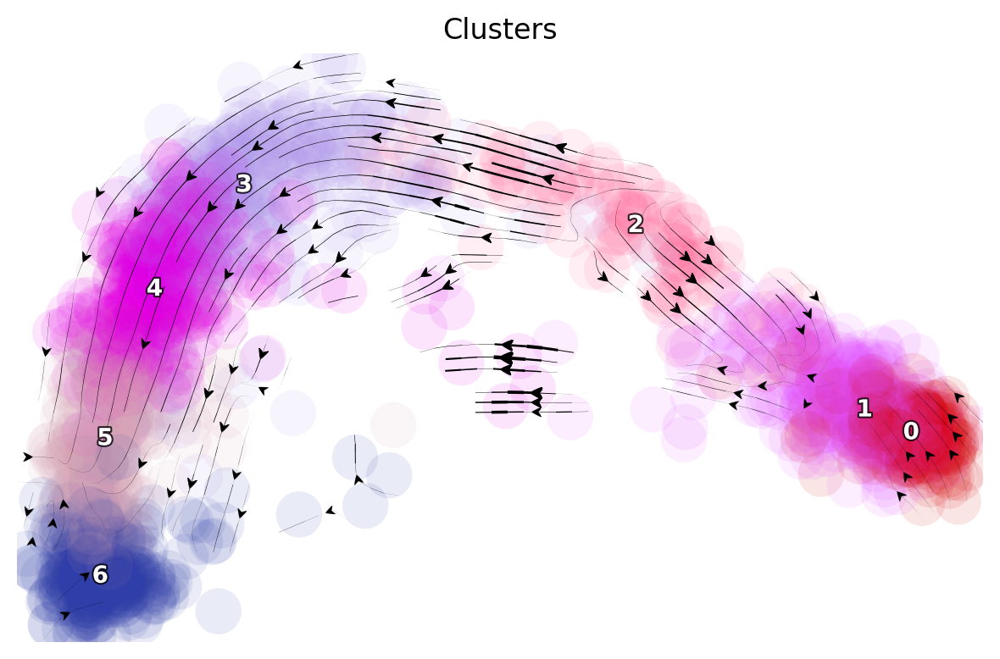

/home/xqiu/python37test-env/lib/python3.7/site-packages/dynamo_release-1.0.0-py3.7.egg/dynamo/plot/topography.py:547: UserWarning: You passed a edgecolor/edgecolors ('black') for an unfilled marker (<matplotlib.markers.MarkerStyle object at 0x7fedc8110990>).  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  zorder=5,
/home/xqiu/python37test-env/lib/python3.7/site-packages/dynamo_release-1.0.0-py3.7.egg/dynamo/plot/topography.py:547: UserWarning: You passed a edgecolor/edgecolors ('black') for an unfilled marker (<matplotlib.markers.MarkerStyle object at 0x7fedb5127050>).  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  zorder=5,


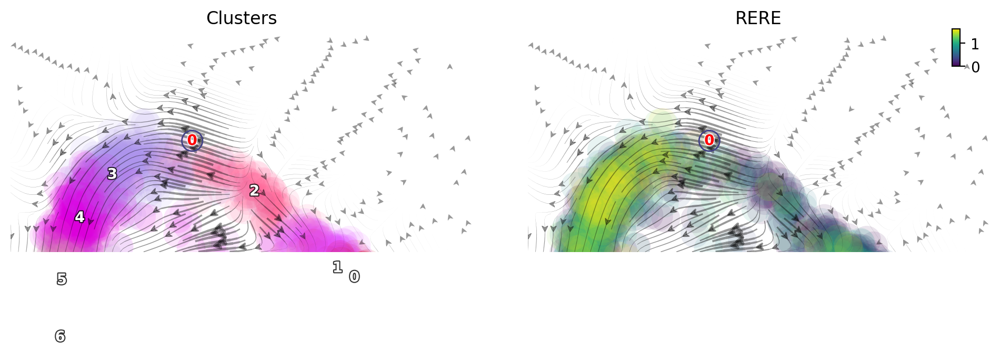

In [18]:
dyn.pl.phase_portraits(adata, genes=['RERE', 'ENO1', 'DHRS3'], ncols=3, figsize=(3, 3), basis='pca', show_quiver=False)

dyn.pl.cell_wise_vectors(adata, color=['Clusters'], basis='pca', quiver_size=2, quiver_length=1) # ['GRIA3', 'LINC00982', 'AFF2']

dyn.pl.grid_vectors(adata, color=['Clusters'], basis='pca', method='gaussian')

dyn.pl.streamline_plot(adata, color=['Clusters'], basis='pca') 

dyn.pl.topography(adata, color=['Clusters', 'RERE'], basis='pca', ncols=2)



In [19]:
dyn.vf.VectorField(adata, basis='pca', dims=[0, 1], M=adata.n_obs)


|-----> vectorfield calculation begins...
|-----> Retrieve X and V based on basis: PCA. 
        Vector field will be learned in the PCA space.
|-----> Generating high dimensional grids and convert into a row matrix.
|-----> Learning vector field with method: sparsevfc.
|-----> [SparseVFC] begins...
|-----> Sampling control points based on data velocity magnitude...
|-----> [SparseVFC] in progress: 100.0000%
|-----> [SparseVFC] finished [167.4356s]
|-----> <insert> velocity_pca_SparseVFC to obsm in AnnData Object.
|-----> <insert> X_pca_SparseVFC to obsm in AnnData Object.
|-----> <insert> VecFld_pca to uns in AnnData Object.
|-----> <insert> control_point_pca to obs in AnnData Object.
|-----> <insert> inlier_prob_pca to obs in AnnData Object.
|-----> <insert> obs_vf_angle_pca to obs in AnnData Object.
|-----> [VectorField] in progress: 100.0000%
|-----> [VectorField] finished [167.5933s]


In [20]:
dyn.pl.streamline_plot(adata, color=['ELAVL4'], basis='pca', show_legend='on data',  background='white', 
                        show_arrowed_spines=False, save_show_or_return='save',
                        pointsize=0.4, ncols=1, alpha = 0.7, 
                       save_kwargs={'prefix': 'hg_streamline', 'ext': 'png',
                                     "bbox_inches": None}, 
                        figsize=(3, 3))

Saving figure to /lab/solexa_weissman/xqiu/proj/Aristotle/dynamo-tutorials/hg_streamline_dyn_savefig.png...
Done


<Figure size 300x300 with 0 Axes>

In [21]:
dyn.pl.phase_portraits(adata, genes=['ELAVL4'], basis='pca',
                       show_quiver=True,
                       background='white',
                        show_arrowed_spines=False, save_show_or_return='save',
                        pointsize=0.4, alpha = 0.7, quiver_length=10, quiver_size=6, 
                       save_kwargs={'prefix': 'hg_phase_portrait', 'ext': 'png',
                                     "bbox_inches": None}, 
                        figsize=(6, 4))

Saving figure to /lab/solexa_weissman/xqiu/proj/Aristotle/dynamo-tutorials/hg_phase_portrait_dyn_savefig.png...
Done


In [22]:
dyn.pl.topography(adata, color=['ELAVL4'], basis='pca', show_legend='on data',  background='white',
                        show_arrowed_spines=False, save_show_or_return='save',
                        pointsize=0.4, ncols=1, alpha = 0.7, 
                       save_kwargs={'prefix': 'hg_topography', 'ext': 'png',
                                     "bbox_inches": None}, 
                        figsize=(3, 3))

/home/xqiu/python37test-env/lib/python3.7/site-packages/dynamo_release-1.0.0-py3.7.egg/dynamo/plot/topography.py:547: UserWarning: You passed a edgecolor/edgecolors ('black') for an unfilled marker (<matplotlib.markers.MarkerStyle object at 0x7ff0fd87e090>).  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  zorder=5,


Saving figure to /lab/solexa_weissman/xqiu/proj/Aristotle/dynamo-tutorials/hg_topography_dyn_savefig.png...
Done


<Figure size 300x300 with 0 Axes>

In [23]:
dyn.tl.cell_velocities(adata, basis='pca')
dyn.vf.VectorField(adata, basis='pca', M=adata.n_obs, pot_curl_div=True)


|-----> [projecting velocity vector to low dimensional embedding] in progress: 8.3721%

Using existing pearson_transition_matrix found in .obsp.


|-----> [projecting velocity vector to low dimensional embedding] in progress: 100.0000%
|-----> [projecting velocity vector to low dimensional embedding] finished [0.9411s]
|-----> vectorfield calculation begins...
|-----> Retrieve X and V based on basis: PCA. 
        Vector field will be learned in the PCA space.
|-----> Learning vector field with method: sparsevfc.
|-----> [SparseVFC] begins...
|-----> Sampling control points based on data velocity magnitude...
|-----> [SparseVFC] in progress: 100.0000%
|-----> [SparseVFC] finished [252.6348s]
|-----> <insert> velocity_pca_SparseVFC to obsm in AnnData Object.
|-----> <insert> X_pca_SparseVFC to obsm in AnnData Object.
|-----> <insert> VecFld_pca to uns in AnnData Object.
|-----> Running ddhodge to estimate vector field based pseudotime in pca basis...
/home/xqiu/python37test-env/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories i

In [24]:
adata

AnnData object with n_obs × n_vars = 1720 × 32738
    obs: 'Clusters', 'nGenes', 'nCounts', 'pMito', 'use_for_pca', 'spliced_Size_Factor', 'initial_spliced_cell_size', 'unspliced_Size_Factor', 'initial_unspliced_cell_size', 'Size_Factor', 'initial_cell_size', 'ntr', 'cell_cycle_phase', 'control_point_pca', 'inlier_prob_pca', 'obs_vf_angle_pca', 'control_point_umap', 'inlier_prob_umap', 'obs_vf_angle_umap', 'pca_ddhodge_div', 'pca_ddhodge_potential', 'divergence_pca'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'cell_cycle_genes', 'nCells', 'nCounts', 'pass_basic_filter', 'score', 'log_cv', 'log_m', 'use_for_pca', 'frac', 'ntr', 'beta', 'gamma', 'half_life', 'alpha_b', 'alpha_r2', 'gamma_b', 'gamma_r2', 'gamma_logLL', 'delta_b', 'delta_r2', 'bs', 'bf', 'uu0', 'ul0', 'su0', 'sl0', 'U0', 'S0', 'total0', 'use_for_dynamics', 'use_for_transition'
    uns: 'pp', 'velocyto_SVR', 'PCs', 'explained_variance_ratio_', 'pca_mean', 'pca_fit', 'feature_selection', 'cell_phase_genes',

In [25]:
dyn.tl.cell_velocities(adata, basis='pca')
dyn.vf.VectorField(adata, basis='pca')
dyn.vf.speed(adata, basis='pca')
dyn.vf.divergence(adata, basis='pca')
dyn.vf.acceleration(adata, basis='pca')
dyn.vf.VectorField(adata, basis='umap', M=adata.n_obs)
dyn.vf.curl(adata, basis='umap')

|-----> [projecting velocity vector to low dimensional embedding] in progress: 23.0233%

Using existing pearson_transition_matrix found in .obsp.


|-----> [projecting velocity vector to low dimensional embedding] in progress: 100.0000%
|-----> [projecting velocity vector to low dimensional embedding] finished [0.7781s]
|-----> vectorfield calculation begins...
|-----> Retrieve X and V based on basis: PCA. 
        Vector field will be learned in the PCA space.
|-----> Learning vector field with method: sparsevfc.
|-----> [SparseVFC] begins...
|-----> Sampling control points based on data velocity magnitude...
|-----> [SparseVFC] in progress: 100.0000%
|-----> [SparseVFC] finished [0.2132s]
|-----> <insert> velocity_pca_SparseVFC to obsm in AnnData Object.
|-----> <insert> X_pca_SparseVFC to obsm in AnnData Object.
|-----> <insert> VecFld_pca to uns in AnnData Object.
|-----> <insert> control_point_pca to obs in AnnData Object.
|-----> <insert> inlier_prob_pca to obs in AnnData Object.
|-----> <insert> obs_vf_angle_pca to obs in AnnData Object.
|-----> [VectorField] in progress: 100.0000%
|-----> [VectorField] finished [0.2907s]
C

In [26]:
adata

AnnData object with n_obs × n_vars = 1720 × 32738
    obs: 'Clusters', 'nGenes', 'nCounts', 'pMito', 'use_for_pca', 'spliced_Size_Factor', 'initial_spliced_cell_size', 'unspliced_Size_Factor', 'initial_unspliced_cell_size', 'Size_Factor', 'initial_cell_size', 'ntr', 'cell_cycle_phase', 'control_point_pca', 'inlier_prob_pca', 'obs_vf_angle_pca', 'control_point_umap', 'inlier_prob_umap', 'obs_vf_angle_umap', 'pca_ddhodge_div', 'pca_ddhodge_potential', 'divergence_pca', 'speed_pca', 'acceleration_pca', 'curl_umap'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'cell_cycle_genes', 'nCells', 'nCounts', 'pass_basic_filter', 'score', 'log_cv', 'log_m', 'use_for_pca', 'frac', 'ntr', 'beta', 'gamma', 'half_life', 'alpha_b', 'alpha_r2', 'gamma_b', 'gamma_r2', 'gamma_logLL', 'delta_b', 'delta_r2', 'bs', 'bf', 'uu0', 'ul0', 'su0', 'sl0', 'U0', 'S0', 'total0', 'use_for_dynamics', 'use_for_transition'
    uns: 'pp', 'velocyto_SVR', 'PCs', 'explained_variance_ratio_', 'pca_mean', 'pca_

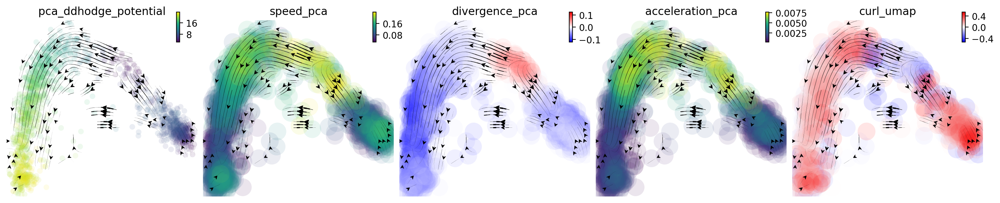

In [27]:
import matplotlib.pyplot as plt
fig1, f1_axes = plt.subplots(ncols=5, nrows=1, constrained_layout=True, figsize=(15, 3))
f1_axes
f1_axes[0] = dyn.pl.streamline_plot(adata, basis='pca', color='pca_ddhodge_potential', pointsize=0.1, alpha = 0.7, ax=f1_axes[0], quiver_length=6, 
                                    quiver_size=6, save_show_or_return='return', show_arrowed_spines=False)
f1_axes[1] = dyn.pl.streamline_plot(adata, basis='pca', color='speed_pca', ax=f1_axes[1], quiver_length=12, quiver_size=12, save_show_or_return='return', 
                                    show_arrowed_spines=False)
f1_axes[2] = dyn.pl.streamline_plot(adata, basis='pca', color='divergence_pca', ax=f1_axes[2], save_show_or_return='return',
                                   show_arrowed_spines=False, cmap='bwr', s_kwargs_dict= {"sym_c": True})
f1_axes[3] = dyn.pl.streamline_plot(adata, basis='pca', color='acceleration_pca', ax=f1_axes[3], save_show_or_return='return', 
                                    show_arrowed_spines=False)
f1_axes[4] = dyn.pl.streamline_plot(adata, basis='pca', color='curl_umap', ax=f1_axes[4], save_show_or_return='return', 
                                    show_arrowed_spines=False, cmap='bwr', s_kwargs_dict= {"sym_c": True})
plt.savefig(dpi=300, fname='./hg_vector_calculus.png')

In [28]:
example_genes = ['ELAVL4']
import numpy as np 

dyn.pl.scatters(adata, x=np.repeat('pca_ddhodge_potential', 1),
                     y=example_genes, layer='X_spliced', color='pca_ddhodge_potential', 
                     background='white', figsize=(3, 3), save_show_or_return='save',
                     pointsize=0.4, ncols=1, alpha = 0.7, 
                     save_kwargs={'prefix': 'hg_potential', 'ext': 'png', "bbox_inches": None})

Saving figure to /lab/solexa_weissman/xqiu/proj/Aristotle/dynamo-tutorials/hg_potential_dyn_savefig.png...
Done


<Figure size 300x300 with 0 Axes>

|-----> [projecting velocity vector to low dimensional embedding] in progress: 14.6512%

Using existing pearson_transition_matrix found in .obsp.


|-----> [projecting velocity vector to low dimensional embedding] in progress: 100.0000%
|-----> [projecting velocity vector to low dimensional embedding] finished [1.3505s]
/home/xqiu/python37test-env/lib/python3.7/site-packages/dynamo_release-1.0.0-py3.7.egg/dynamo/plot/scVectorField.py:1147: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


<Figure size 600x400 with 0 Axes>

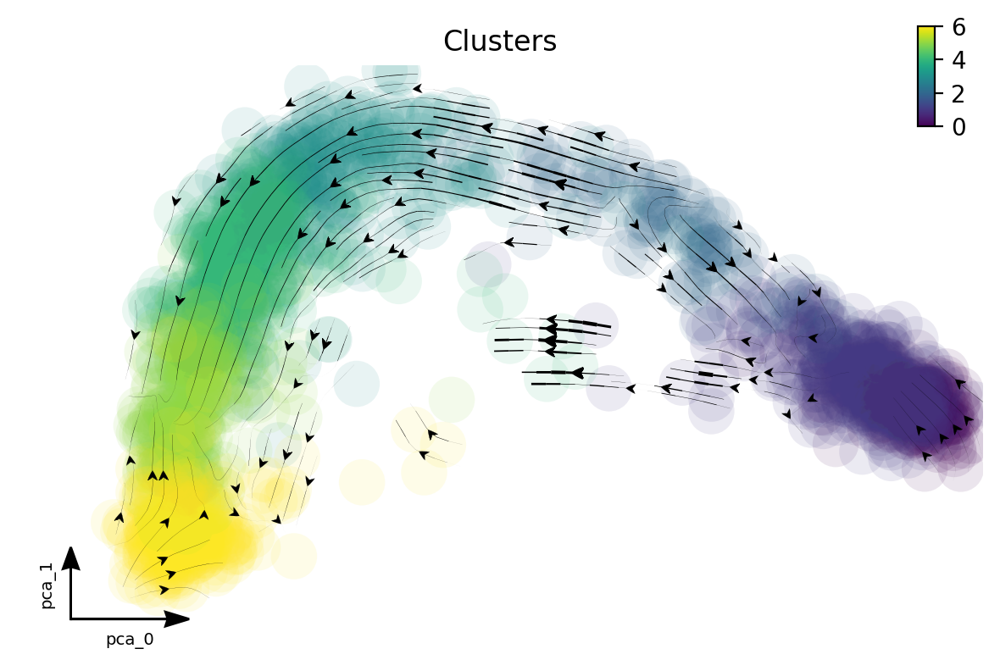

In [31]:

# run dynamo determinstic 

# run dynamo to get RNA velocity 

dyn.configuration.set_figure_params('dynamo', background='white')

adata_det = dyn.sample_data.hgForebrainGlutamatergic()

dyn.pp.recipe_monocle(adata_det, n_top_genes=1000, fg_kwargs={'shared_count': 20})

dyn.tl.dynamics(adata_det, model='deterministic')

dyn.tl.reduceDimension(adata_det, n_pca_components=30)

dyn.tl.cell_velocities(adata_det, method='pearson', basis='pca', other_kernels_dict={'transform': 'sqrt'})
dyn.pl.streamline_plot(adata_det, color=['Clusters'], basis='pca', show_legend='on data', show_arrowed_spines=True)


|-----> Downloading data to ./data/hgForebrainGlut.loom
|-----> apply Monocole recipe to adata...
|-----> <insert> pp to uns in AnnData Object.
|-----------> <insert> has_splicing to uns['pp'] in AnnData Object.
|-----------> <insert> has_labling to uns['pp'] in AnnData Object.
|-----------> <insert> splicing_labeling to uns['pp'] in AnnData Object.
|-----------> <insert> has_protein to uns['pp'] in AnnData Object.
|-----> ensure all cell and variable names unique.
|-----> ensure all data in different layers in csr sparse matrix format.
|-----> ensure all labeling data properly collapased
|-----------> <insert> tkey to uns['pp'] in AnnData Object.
|-----------> <insert> experiment_type to uns['pp'] in AnnData Object.
|-----> filtering cells...
|-----> filtering genes...
|-----> calculating size factor...
|-----> selecting genes...
|-----> <insert> frac to var in AnnData Object.
|-----> size factor normalizing the data, followed by log1p transformation.
|-----> applying PCA ...
|-----> 

<Figure size 600x400 with 0 Axes>

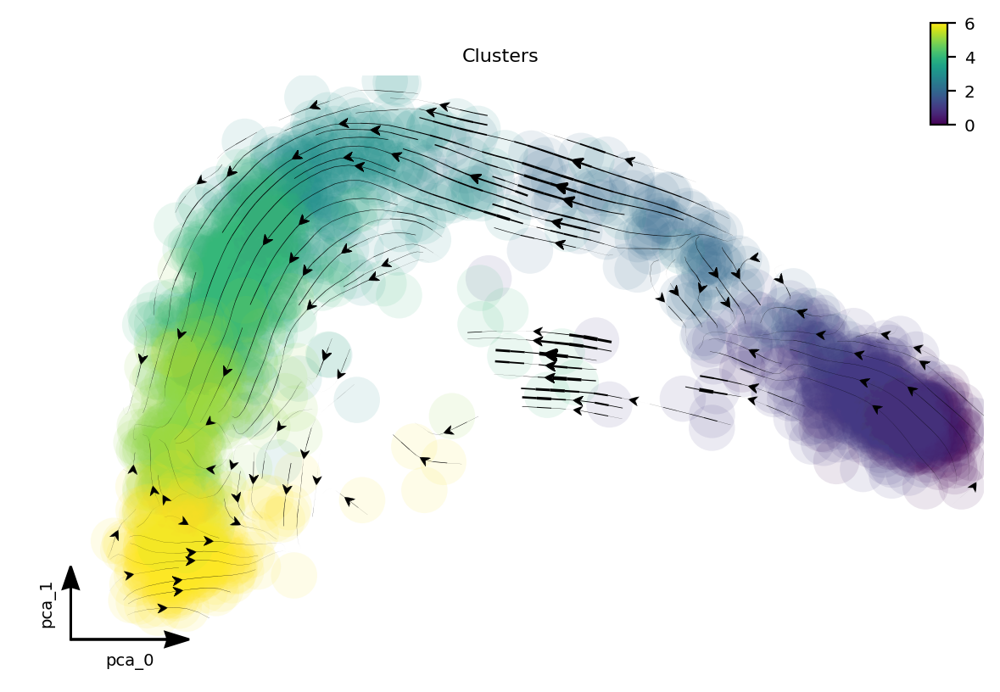

In [44]:
# run dynamo stochastic 

# run dynamo to get RNA velocity 

dyn.configuration.set_figure_params('dynamo', background='white')

adata_sto = dyn.sample_data.hgForebrainGlutamatergic()

dyn.pp.recipe_monocle(adata_sto, n_top_genes=1000, fg_kwargs={'shared_count': 20})

dyn.tl.dynamics(adata_sto, model='stochastic')

dyn.tl.reduceDimension(adata_sto, n_pca_components=30)

dyn.tl.cell_velocities(adata_sto, method='pearson', basis='pca', other_kernels_dict={'transform': 'sqrt'})
dyn.pl.streamline_plot(adata_sto, color=['Clusters'], basis='pca', show_legend='on data', show_arrowed_spines=True)

|-----> Downloading data to ./data/hgForebrainGlut.loom
|-----> apply Monocole recipe to adata...
|-----> <insert> pp to uns in AnnData Object.
|-----------> <insert> has_splicing to uns['pp'] in AnnData Object.
|-----------> <insert> has_labling to uns['pp'] in AnnData Object.
|-----------> <insert> splicing_labeling to uns['pp'] in AnnData Object.
|-----------> <insert> has_protein to uns['pp'] in AnnData Object.
|-----> ensure all cell and variable names unique.
|-----> ensure all data in different layers in csr sparse matrix format.
|-----> ensure all labeling data properly collapased
|-----------> <insert> tkey to uns['pp'] in AnnData Object.
|-----------> <insert> experiment_type to uns['pp'] in AnnData Object.
|-----> filtering cells...
|-----> filtering genes...
|-----> calculating size factor...
|-----> selecting genes...
|-----> <insert> frac to var in AnnData Object.
|-----> size factor normalizing the data, followed by log1p transformation.
|-----> applying PCA ...
|-----> 

<Figure size 600x400 with 0 Axes>

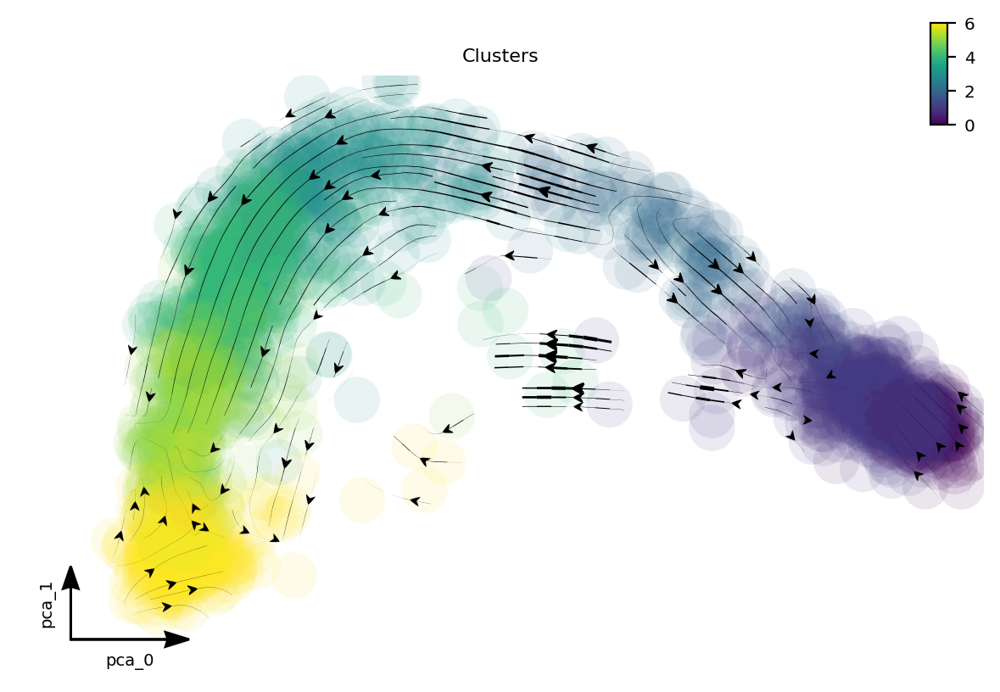

In [33]:
# run dynamo nb 


# run dynamo to get RNA velocity 

dyn.configuration.set_figure_params('dynamo', background='white')

adata_nb = dyn.sample_data.hgForebrainGlutamatergic()

dyn.pp.recipe_monocle(adata_nb, n_top_genes=1000, fg_kwargs={'shared_count': 20})

dyn.tl.dynamics(adata_nb, est_method='negbin')

dyn.tl.reduceDimension(adata_nb, n_pca_components=30)

dyn.tl.cell_velocities(adata_nb, method='pearson', basis='pca', other_kernels_dict={'transform': 'sqrt'})
dyn.pl.streamline_plot(adata_nb, color=['Clusters'], basis='pca', show_legend='on data', show_arrowed_spines=True)


In [45]:
adata_sto.var.use_for_transition.sum(), adata_det.var.use_for_transition.sum(), adata_nb.var.use_for_transition.sum()

(542, 558, 560)

In [46]:
dyn.cleanup(adata_sto)
dyn.cleanup(adata_det)
dyn.cleanup(adata_nb)

AnnData object with n_obs × n_vars = 1720 × 32738
    obs: 'Clusters', 'nGenes', 'nCounts', 'pMito', 'use_for_pca', 'spliced_Size_Factor', 'initial_spliced_cell_size', 'unspliced_Size_Factor', 'initial_unspliced_cell_size', 'Size_Factor', 'initial_cell_size', 'ntr', 'cell_cycle_phase'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'cell_cycle_genes', 'nCells', 'nCounts', 'pass_basic_filter', 'score', 'log_cv', 'log_m', 'use_for_pca', 'frac', 'ntr', 'beta', 'gamma', 'half_life', 'alpha_b', 'alpha_r2', 'gamma_b', 'gamma_r2', 'gamma_logLL', 'delta_b', 'delta_r2', 'bs', 'bf', 'uu0', 'ul0', 'su0', 'sl0', 'U0', 'S0', 'total0', 'use_for_dynamics', 'use_for_transition'
    uns: 'pp', 'velocyto_SVR', 'PCs', 'explained_variance_ratio_', 'pca_mean', 'pca_fit', 'feature_selection', 'cell_phase_genes', 'dynamics', 'neighbors', 'umap_fit', 'grid_velocity_pca'
    obsm: 'X_pca', 'X', 'cell_cycle_scores', 'X_umap', 'velocity_pca'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

In [47]:
adata_sto.write_h5ad('./data/hgForebrainGlutamatergic_dynamo_stochastic.h5ad')
adata_det.write_h5ad('./data/hgForebrainGlutamatergic_dynamo_det.h5ad')
adata_nb.write_h5ad('./data/hgForebrainGlutamatergic_dynamo_nb.h5ad')

In [48]:
adata_sto.obs.Clusters = adata_sto.obs.Clusters.astype(str)
adata_det.obs.Clusters = adata.obs.Clusters.astype(str)
adata_nb.obs.Clusters = adata.obs.Clusters.astype(str)

In [49]:
dyn.pl.streamline_plot(adata, color=['Clusters'], basis='pca', show_legend='on data',  background='white',
                        show_arrowed_spines=False, save_show_or_return='save',
                        pointsize=0.4, ncols=1, alpha = 0.7, 
                       save_kwargs={'prefix': 'hg_dynamo_stochastic', 'ext': 'svg',
                                     "bbox_inches": None}, 
                        figsize=(4, 3))

Saving figure to /lab/solexa_weissman/xqiu/proj/Aristotle/dynamo-tutorials/hg_dynamo_stochastic_dyn_savefig.svg...
Done


<Figure size 400x300 with 0 Axes>

In [50]:
dyn.pl.streamline_plot(adata_det, color=['Clusters'], basis='pca', show_legend='on data',  background='white',
                        show_arrowed_spines=False, save_show_or_return='save',
                        pointsize=0.4, ncols=1, alpha = 0.7, 
                       save_kwargs={'prefix': 'hg_dynamo_det', 'ext': 'svg',
                                     "bbox_inches": None}, 
                        figsize=(4, 3))

Saving figure to /lab/solexa_weissman/xqiu/proj/Aristotle/dynamo-tutorials/hg_dynamo_det_dyn_savefig.svg...
Done


<Figure size 400x300 with 0 Axes>

In [51]:
dyn.pl.streamline_plot(adata_nb, color=['Clusters'], basis='pca', show_legend='on data',  background='white',
                        show_arrowed_spines=False, save_show_or_return='save',
                        pointsize=0.4, ncols=1, alpha = 0.7, 
                       save_kwargs={'prefix': 'hg_dynamo_nb', 'ext': 'svg',
                                     "bbox_inches": None}, 
                        figsize=(4, 3))

Saving figure to /lab/solexa_weissman/xqiu/proj/Aristotle/dynamo-tutorials/hg_dynamo_nb_dyn_savefig.svg...
Done


<Figure size 400x300 with 0 Axes>